# Import libraries

In [18]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import folium

from sklearn.ensemble import RandomForestClassifier
from sklearn.inspection import permutation_importance
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report

import joblib

import time
import os

# Import Data

In [5]:
def import_data(file_path):
    # Read data from the specified file path
    df_raw=pd.read_csv(file_path)

    # Return the imported DataFrame
    return df_raw

# Cleaning Data

# Feature Engineering

In [6]:
def calculate_alt_change(df):

    # Add new column with calculated Altitude Change
    df['Alt(m)_change'] = df['Alt(m)'].diff().fillna(0)

    # Remove outliers
    # Set the threshold value for filtering
    alt_threshold = 20

    # Filter the DataFrame based on the absolute value of 'Alt(m)_change' column
    df = df[df['Alt(m)_change'].abs() <= alt_threshold]

    return df

# option to add log file later on
# print shape before and after outlier detection and removal

In [7]:
def plot_alt_changes(df):

    # Create a histogram plot
    plt.hist(df['Alt(m)_change'],
             bins=20,
             color='skyblue',
             edgecolor='black')

    #Add labels and title
    plt.xlabel('Altitude (m)')
    plt.ylabel('Frequency')
    plt.title('Altitude Changes')

    #Show the plot
    plt.show()

In [8]:
def calculate_speed_change(df):

    # Add new column with calculated Speed Change
    df['Speed(m/s)_change'] = df['Speed(m/s)'].diff().fillna(0)

    # Remove outliers
    # Set the threshold value for filtering
    threshold_speed = 3

    # Filter the DataFrame based on the absolute value of 'Speed(m/s)_change' column
    df = df[df['Speed(m/s)_change'].abs() <= threshold_speed]

    return df

    # option to add log file later on
    # print shape before and after outlier detection and removal

In [9]:
def plot_speed_changes(df):

    # Create a histogram plot
    plt.hist(df['Speed(m/s)_change'],
             bins=20,
             color='skyblue',
             edgecolor='black')

    #Add labels and title
    plt.xlabel('Speed Change (m/s)')
    plt.ylabel('Frequency')
    plt.title('Speed Changes')

    #Show the plot
    plt.show()

In [10]:
def calculate_course_change(df):

    # Add new column with calculated Course Change
    df['Course_change'] = df['Course'].diff().fillna(0)

    return df

    # option to add log file later on
    # print shape before and after outlier detection and removal

In [11]:
def convert_datetime(df):

    # Convert 'Timestamp' column to datetime format
    df['Timestamp'] = pd.to_datetime(df['Timestamp'], unit='ns')

    return df

# Prediction

In [12]:
def select_features(df):

    features_to_use = ['accelX(g)', 'accelY(g)', 'accelZ(g)', 'accelUserX(g)', 'accelUserY(g)',
       'accelUserZ(g)', 'gyroX(rad/s)', 'gyroY(rad/s)', 'gyroZ(rad/s)',
       'Roll(rads)', 'Pitch(rads)', 'Yaw(rads)', 'Lat', 'Long', 'Speed(m/s)',
       'HorizontalAccuracy(m)', 'VerticalAccuracy(m)', 'Course', 'calMagX(µT)',
       'calMagY(µT)', 'calMagZ(µT)', 'Alt(m)_change',
       'Speed(m/s)_change', 'Course_change']

    X=df[features_to_use]

    return X

In [13]:
def load_model(file_path_to_model):

    # Load the saved model
    return joblib.load(file_path_to_model)


In [14]:
def show_hyperparameters(model):
    # show hyperparameters
    return model.get_params()


In [15]:
def predict_on_features(model, df, features):

    predictions=model.predict(features)

    df['predicted']=predictions

    return df


# Mapping and Plotting

In [16]:
def plot_prediction(df, plot_title='Predictions'):
    # Check if 'Timestamp' column exists and is in datetime format
    if 'Timestamp' in df.columns and pd.api.types.is_datetime64_any_dtype(df['Timestamp']):
        # Create a scatter plot for Altitude over Time, colored by 'predicted' class
        fig = px.scatter(df, x='Timestamp', y='Alt(m)', color='predicted',
                         labels={'Alt(m)': 'Altitude (m)'},
                         title=plot_title,
                         color_discrete_map={0: 'blue', 1: 'red'})

        fig.update_traces(marker=dict(size=8),
                          selector=dict(mode='markers'))

        # Customize the legend
        fig.update_layout(
            legend_title_text='Status',
            width=1000,
            height=600
        )

        fig.for_each_trace(lambda trace: trace.update(name='Not on the lift' if trace.name == 0 else 'On the lift'))

        # Show the plot
        fig.show()
    else:
        print("Warning: DataFrame's 'Timestamp' column is not in datetime format and must be converted first.")

In [36]:
df_95=pd.read_csv(path_to_df_95)

In [17]:
def plot_total_alt_over_time(df, plot_title='Total Tracked Altitude Over Time'):

    # Create a line plot using Plotly
    fig = go.Figure()

    # Add a trace for altitude over time
    fig.add_trace(go.Scatter(x=df['Timestamp'],
                             y=df['Alt(m)'],
                             mode='lines',
                             name='Altitude'))

    # Update layout
    fig.update_layout(title=plot_title,
                      xaxis_title='Timestamp',
                      yaxis_title='Altitude (m)')

    # Show plot
    fig.show()

In [50]:
def map_movement(df, zoom_start=12):

    map_center = [df['Lat'].mean(), df['Long'].mean()]
    movement_on_map = folium.Map(location=map_center, zoom_start=zoom_start)

# Add CircleMarkers for each data point
    for index, row in df.iterrows():
        folium.CircleMarker(location=[row['Lat'], row['Long']], radius=5, color='blue', fill=True, fill_color='blue').add_to(movement_on_map)
# Display the map
    return movement_on_map



In [51]:
map_movement(df_95)

In [20]:

def map_lifts_and_not_lifts(df,column='on_lift', zoom_start=15 ):
    # Create a map centered on the mean latitude and longitude
    map_center = [df['Lat'].mean(), df['Long'].mean()]
    tracking_map = folium.Map(location=map_center, zoom_start=zoom_start)

    # Plot data points with on_lift type
    on_lift = df[df[column] == 1]
    for _, row in on_lift.iterrows():
        folium.CircleMarker(location=[row['Lat'], row['Long']], radius=5, color='red', fill=True, fill_color='red', tooltip=str(row['Timestamp'])).add_to(tracking_map)

    # Plot data points with not_on_lift  types
    not_on_lift = df[df[column] != 1]
    for _, row in not_on_lift.iterrows():
        folium.CircleMarker(location=[row['Lat'], row['Long']], radius=5, color='blue', fill=True, fill_color='blue', tooltip=str(row['Timestamp'])).add_to(tracking_map)

    # Return the map object
    return tracking_map


In [42]:
map_lifts_and_not_lifts(df_95)

Index(['Timestamp', 'accelX(g)', 'accelY(g)', 'accelZ(g)', 'accelUserX(g)',
       'accelUserY(g)', 'accelUserZ(g)', 'gyroX(rad/s)', 'gyroY(rad/s)',
       'gyroZ(rad/s)', 'Roll(rads)', 'Pitch(rads)', 'Yaw(rads)', 'm11', 'm12',
       'm13', 'm21', 'm22', 'm23', 'm31', 'm32', 'm33', 'qX', 'qY', 'qZ', 'qW',
       'Lat', 'Long', 'Speed(m/s)', 'TrueHeading', 'Alt(m)',
       'HorizontalAccuracy(m)', 'VerticalAccuracy(m)', 'Course',
       'ActivityType', 'ActivityConfidence', 'Pressure(kilopascals)',
       'RelativeAltitude(meters)', 'magX(µT)', 'magY(µT)', 'magZ(µT)',
       'calMagX(µT)', 'calMagY(µT)', 'calMagZ(µT)'],
      dtype='object')

In [21]:
#Map only lifts rides

def map_lift_ride(df,column='on_lift', zoom_start=15 ):
    # Create a map centered on the mean latitude and longitude
    map_center = [df['Lat'].mean(), df['Long'].mean()]
    lift_map = folium.Map(location=map_center, zoom_start=zoom_start)

    # Plot data points with on_lift type
    on_lift = df[df[column] == 1]
    for _, row in on_lift.iterrows():
        folium.CircleMarker(location=[row['Lat'],
                                      row['Long']],
                                      radius=5,
                                      color='red',
                                      fill=True,
                                      fill_color='red',
                                      tooltip=str(row['Timestamp'])).add_to(lift_map)

    # Return the map object
    return lift_map




# Prediction steps in one function

In [ ]:
# use this to predict on a csv that already has all data points
def predict_on_data(path_to_csv_file, file_path_to_model):

    # Load the data
    df = pd.read_csv(path_to_csv_file)

    # Preprocess and feature engineering
    df = calculate_alt_change(df)
    df = calculate_speed_change(df)
    df = calculate_course_change(df)
    df = convert_datetime(df)

    # Feature selection
    features = select_features(df)

    # Load the model
    rfc = joblib.load(file_path_to_model)

    # Make predictions
    df = predict_on_features(rfc, df, features)

    # Plot predictions
    plot_prediction(df)



# Real time prediction function

##### This is the hot stuff to work on :)

In [ ]:
def fetch_and_process_data(path_to_csv_file, chunk_size=60, wait_time=2):

    # Load the dataset
    df_with_all_rows = pd.read_csv(path_to_csv_file)

    # Calculate the total number of chunks
    total_chunks = len(df_with_all_rows) // chunk_size

    # Initialize an empty list to store all calculations
    all_calculations = pd.DataFrame()

    for i in range(total_chunks):
        # Fetch a chunk of 60 observations
        start_index = i * chunk_size
        end_index = start_index + chunk_size
        data_chunk = df_with_all_rows.iloc[start_index:end_index]

        if len(data_chunk) > 0:

            # Append the processed chunk to the list of all calculations
            all_calculations = pd.concat([all_calculations, data_chunk], ignore_index=True)

            # Print the first few rows of the processed chunk for demonstration
        #     print(f"Processed chunk {i+1}.")
        #     print(data_chunk.head())

            # funct(all_calculations)

            # Preprocess and feature engineering
            df = calculate_alt_change(all_calculations)
            df = calculate_speed_change(df)
            df = calculate_course_change(df)
            df = convert_datetime(df)

            print(df.shape)

            # # Feature selection
            # features = select_features(df)

            # # Make predictions
            # df = predict_on_features(rfc, df, features)


            # print(len(data_chunk))
            # print(len(all_calculations))

        else:
            print(f"No more data to process in chunk {i+1}.")



        # Wait for declared wait_time before processing the next chunk
        time.sleep(wait_time)



# To do before going for one of the above mentioned options

Make sure that specify the paths and other variables needed

In [ ]:
# These are the default values used in the function fetch_and_process_data, change if needed
chunk_size=60
wait_time=2

In [ ]:
# # Specify the file path to directory with data to predict on
# path_to_csv_file='/Users/ze/Documents/Coding/Projects/2024/alturos/data/processed/df_310_labeled_on_lift_v4.csv'

In [32]:
# Specify the file path to directory with data to predict on
path_to_df_95='/content/df_95_labeled_on_lift.csv'
#path_to_df_310='/Users/ze/Documents/Coding/Projects/2024/alturos/data/raw/v5_20230408_082538_310m.csv'
#path_to_df_Natschen_18='/Users/ze/Documents/Coding/Projects/2024/alturos/data/raw/Natschen-2024-02-04_12-04-18.csv'
#path_to_df_Natschen_46='/Users/ze/Documents/Coding/Projects/2024/alturos/data/raw/Natschen-2024-02-04_12-01-46.csv'

In [ ]:
# Specify the file path to pre-trained model
path_to_model_0_1 = '/Users/ze/Documents/Coding/Projects/2024/alturos/models/rf_v_0.1.pkl'
path_to_model_0_2 = '/Users/ze/Documents/Coding/Projects/2024/alturos/models/rf_v_0.2.pkl'
path_to_model_0_3 = '/Users/ze/Documents/Coding/Projects/2024/alturos/models/rf_v_0.3.pkl'
path_to_model_0_4 = '/Users/ze/Documents/Coding/Projects/2024/alturos/models/rf_v_0.4.pkl'
path_to_model_0_5 = '/Users/ze/Documents/Coding/Projects/2024/alturos/models/rf_v_0.5.pkl'

# Option 1: 'Real time' prediction

In [ ]:
# # Call this function to simulate prediction in 'real time'
# fetch_and_process_data(path_to_csv_file,
#                        chunk_size=60,
#                        wait_time=0.1)

# Option 2: One step to prediction

In [ ]:
path_to_model=path_to_model_0_3

----- df_95 -----


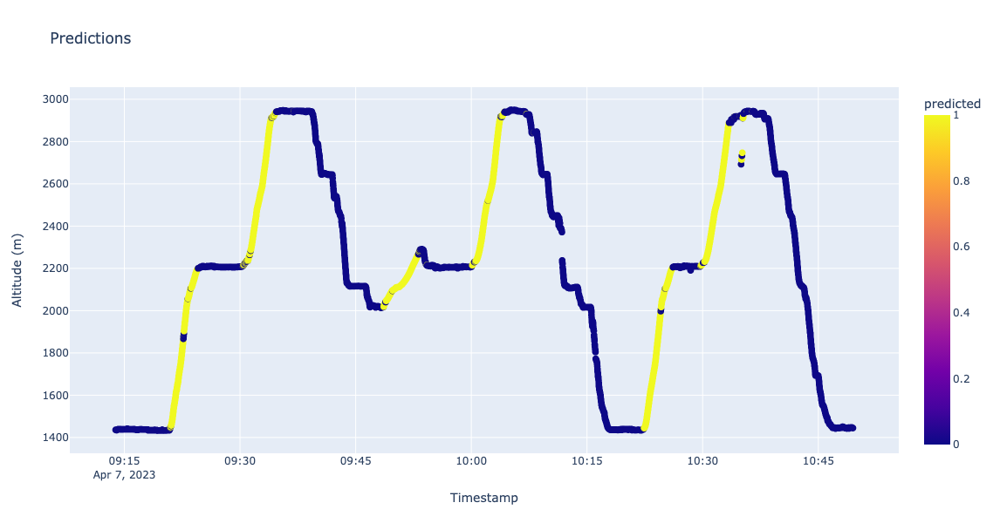

----- df_310 -----


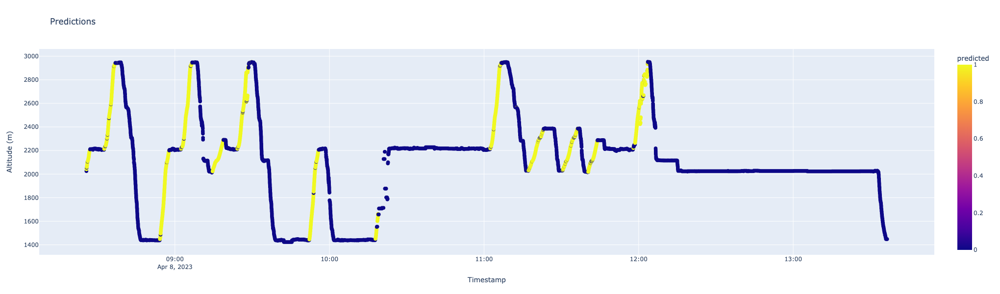

----- df_Natschen_18 -----


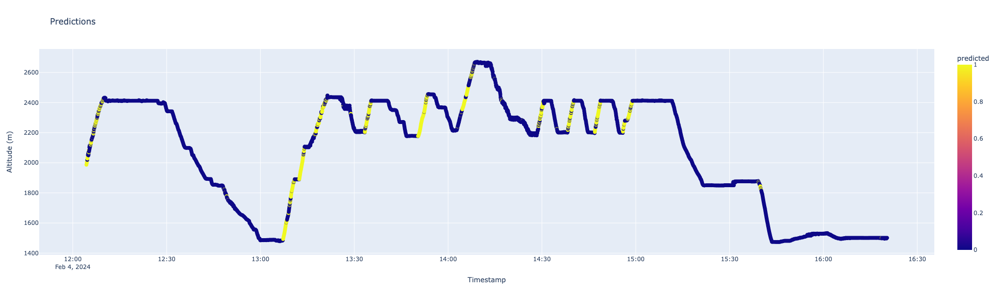

In [ ]:
print('----- df_95 -----')
predict_on_data(path_to_df_95, path_to_model)
print('----- df_310 -----')
predict_on_data(path_to_df_310, path_to_model)
print('----- df_Natschen_18 -----')
predict_on_data(path_to_df_Natschen_18, path_to_model)

----- df_Natschen_46 -----


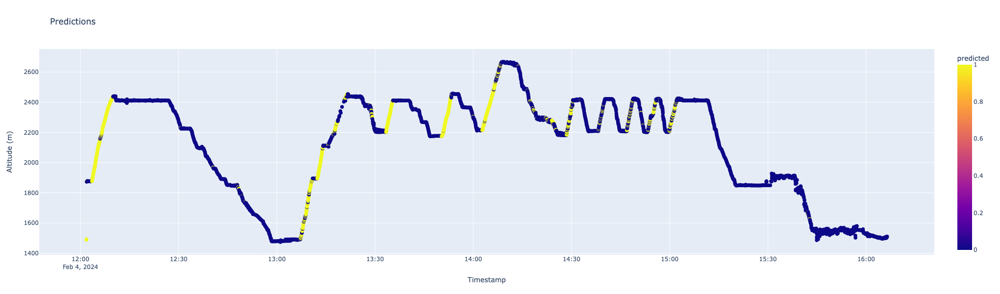

In [ ]:
print('----- df_Natschen_46 -----')
predict_on_data(path_to_df_Natschen_46, path_to_model)

# Option 3: Go through everything step by step

In [ ]:
df_option3=import_data(path_to_csv_file)

In [ ]:
df_option3=calculate_alt_change(df_option3)

In [ ]:
df_option3=calculate_speed_change(df_option3)

In [ ]:
df_option3=calculate_course_change(df_option3)

In [ ]:
df_option3=convert_datetime(df_option3)

In [ ]:
features=select_features(df_option3)

In [ ]:
rfc=load_model(file_path_to_model)

In [ ]:
df_option3=predict_on_features(rfc, df_option3, features)

In [ ]:
plot_prediction(df_option3)